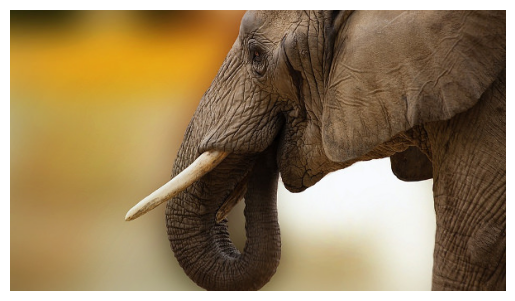

In [7]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img = mpimg.imread("C:/Users/yuval/Downloads/Elephant-Drawing.jpg")

# Display the image
plt.imshow(img)
plt.axis('off')  
plt.show()


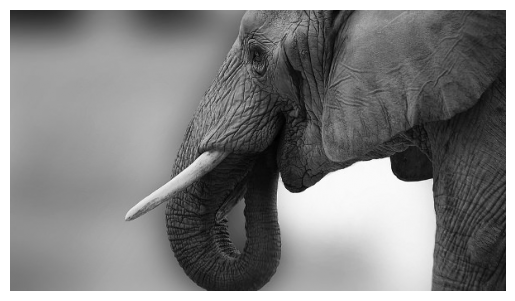

In [10]:
import cv2
import matplotlib.pyplot as plt
img = cv2.imread("C:/Users/yuval/Downloads/Elephant-Drawing.jpg")

gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_img,cmap='gray')
plt.axis('off')  # Hide the axes
plt.show()


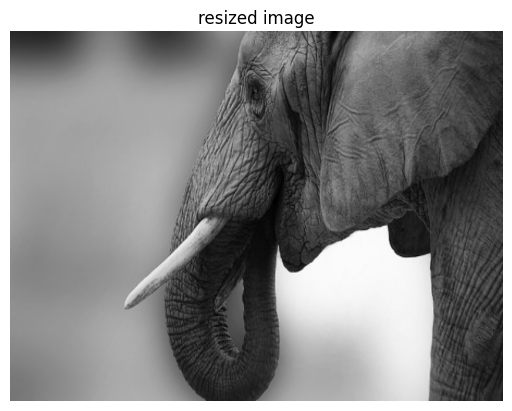

In [11]:
resized_img=cv2.resize(gray_img,(640,480))
plt.imshow(resized_img,cmap='gray')
plt.title('resized image')
plt.axis('off')  # Hide the axes
plt.show() 


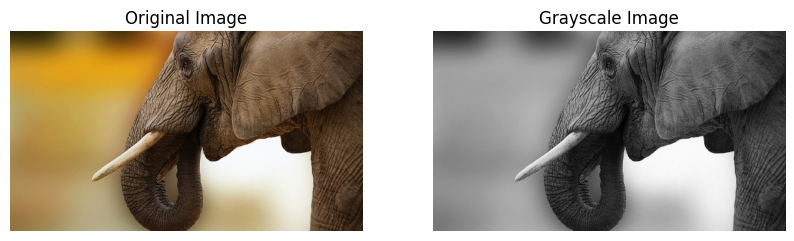

In [12]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

img = mpimg.imread("C:/Users/yuval/Downloads/Elephant-Drawing.jpg") 

if img.ndim == 3: 
    
    grayscale_image = 0.2989 * img[:, :, 0] + 0.5870 * img[:, :, 1] + 0.1140 * img[:, :, 2]
else:
    grayscale_image = img

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(img)
ax[0].set_title("Original Image")
ax[0].axis('off')


ax[1].imshow(grayscale_image, cmap='gray')
ax[1].set_title("Grayscale Image")
ax[1].axis('off')

plt.show()



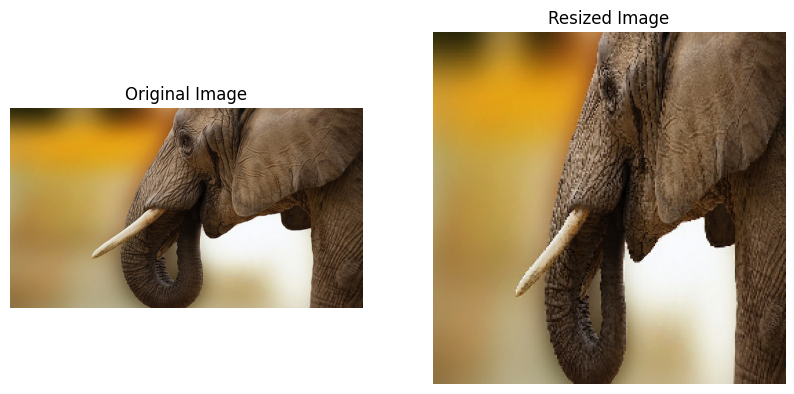

In [14]:

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

def resize_image_nearest_neighbor(image, new_width, new_height):
    old_height, old_width, channels = image.shape

    resized_image = np.zeros((new_height, new_width, channels), dtype=np.uint8)

    for i in range(new_height):
        for j in range(new_width):
            # Find the corresponding pixel in the original image
            old_i = int(i * old_height / new_height)
            old_j = int(j * old_width / new_width)
            resized_image[i, j] = image[old_i, old_j]
    
    return resized_image
img = mpimg.imread("C:/Users/yuval/Downloads/Elephant-Drawing.jpg") 

new_width, new_height = 256, 256

resized_img = resize_image_nearest_neighbor(img, new_width, new_height)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(img)
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(resized_img)
ax[1].set_title("Resized Image")
ax[1].axis('off')

plt.show()


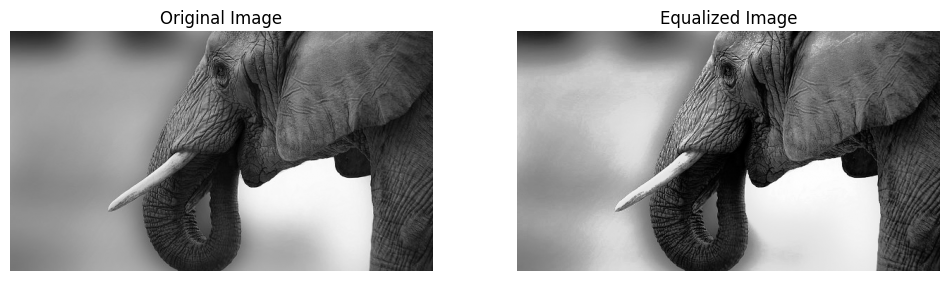

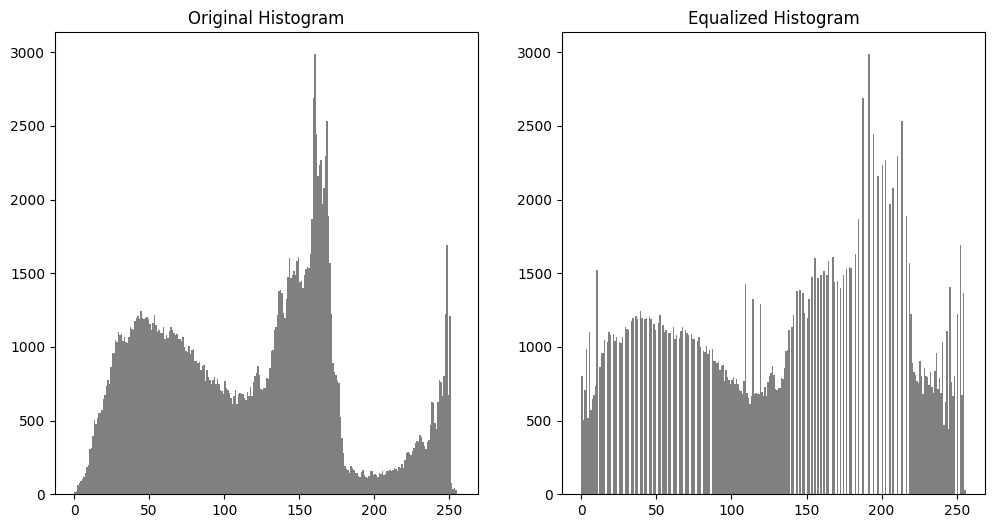

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg

def histogram_equalization(gray_img):

    hist, bins = np.histogram(gray_img.flatten(), bins=256, range=[0, 256])
    
    
    cdf = hist.cumsum()  
    cdf_normalized = cdf * float(hist.max()) / cdf.max()  
    
   
    cdf_m = np.ma.masked_equal(cdf, 0)  
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min()) 
    cdf = np.ma.filled(cdf_m, 0).astype('uint8') 
    
    gray_img = gray_img.astype(np.uint8)
    img_equalized = cdf[gray_img]
    
    return img_equalized


img = mpimg.imread("C:/Users/yuval/Downloads/Elephant-Drawing.jpg") 
if img.ndim == 3: 
    gray_img = 0.2989 * img[:, :, 0] + 0.5870 * img[:, :, 1] + 0.1140 * img[:, :, 2]
else:
    gray_img = img  

img_equalized = histogram_equalization(gray_img)
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].imshow(gray_img, cmap='gray')
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(img_equalized, cmap='gray')
ax[1].set_title("Equalized Image")
ax[1].axis('off')

plt.show()


fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].hist(gray_img.flatten(), bins=256, range=[0, 256], color='gray')
ax[0].set_title("Original Histogram")

ax[1].hist(img_equalized.flatten(), bins=256, range=[0, 256], color='gray')
ax[1].set_title("Equalized Histogram")

plt.show()


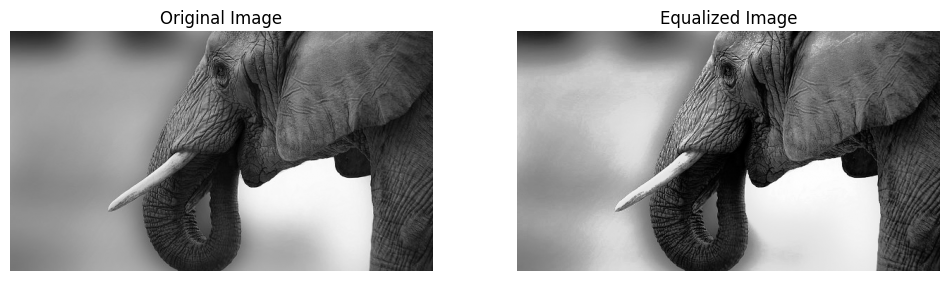

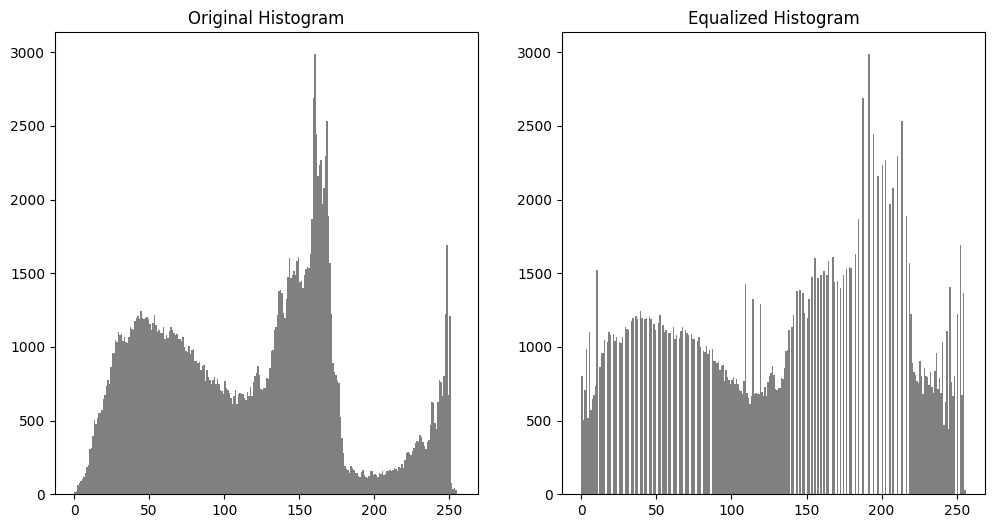

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg

def histogram_equalization_manual(gray_img):
    
    hist, bins = np.histogram(gray_img.flatten(), bins=256, range=[0, 256])
    
   
    cdf = hist.cumsum() 
    cdf_normalized = cdf * float(hist.max()) / cdf.max() 
     
    cdf_m = np.ma.masked_equal(cdf, 0)  
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())  
    cdf = np.ma.filled(cdf_m, 0).astype('uint8') 
    
    gray_img = gray_img.astype(np.uint8)
    img_equalized = cdf[gray_img]
    
    return img_equalized

img = mpimg.imread("C:/Users/yuval/Downloads/Elephant-Drawing.jpg")

if img.ndim == 3:  
    gray_img = 0.2989 * img[:, :, 0] + 0.5870 * img[:, :, 1] + 0.1140 * img[:, :, 2]
else:
    gray_img = img  

img_equalized = histogram_equalization_manual(gray_img)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].imshow(gray_img, cmap='gray')
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(img_equalized, cmap='gray')
ax[1].set_title("Equalized Image")
ax[1].axis('off')

plt.show()

fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].hist(gray_img.flatten(), bins=256, range=[0, 256], color='gray')
ax[0].set_title("Original Histogram")

ax[1].hist(img_equalized.flatten(), bins=256, range=[0, 256], color='gray')
ax[1].set_title("Equalized Histogram")

plt.show()


In [17]:
gray_img.shape

(340, 600)

In [18]:
gray_img


array([[ 39.3585,  39.3585,  39.3585, ...,  33.0586,  37.6991,  44.6984],
       [ 40.1304,  40.1304,  40.1304, ...,  40.0687,  41.0686,  45.0682],
       [ 42.1302,  42.1302,  42.1302, ...,  44.965 ,  44.2532,  43.2533],
       ...,
       [118.1738, 118.1738, 118.1738, ...,  41.0686,  34.6994,  28.9881],
       [118.163 , 118.163 , 118.1738, ...,  39.0688,  32.6996,  27.2163],
       [118.163 , 118.163 , 118.163 , ...,  36.0691,  28.7   ,  24.2166]],
      shape=(340, 600))

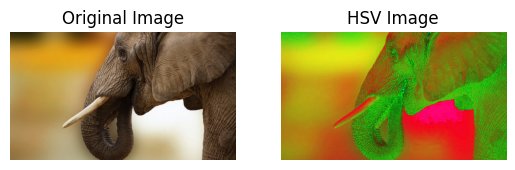

In [1]:
import cv2
import matplotlib.pyplot as plt

image = cv2.imread("C:/Users/yuval/Downloads/Elephant-Drawing.jpg")

hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) 
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(hsv_image, cv2.COLOR_BGR2RGB))  
plt.title('HSV Image')
plt.axis('off')

plt.show()



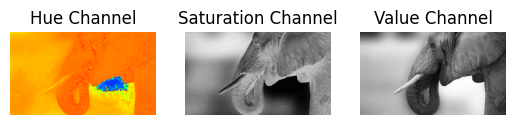

In [2]:
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

hue_channel, saturation_channel, value_channel = cv2.split(hsv_image)

plt.subplot(1, 3, 1)
plt.imshow(hue_channel, cmap='hsv')
plt.title('Hue Channel')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(saturation_channel, cmap='gray')
plt.title('Saturation Channel')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(value_channel, cmap='gray')
plt.title('Value Channel')
plt.axis('off')

plt.show()



In [ ]:
import numpy as np
import cv2

def scale_image(image, scale_factor):
    original_height, original_width = image.shape[:2]

    new_width = int(original_width * scale_factor)
    new_height = int(original_height * scale_factor)

    scaled_image = np.zeros((new_height, new_width, 3), dtype=image.dtype)

    for y in range(new_height):
        for x in range(new_width):
            original_x = x / scale_factor
            original_y = y / scale_factor
            
            original_x = int(np.round(original_x))
            original_y = int(np.round(original_y))

            if 0 <= original_x < original_width and 0 <= original_y < original_height:
                scaled_image[y, x] = image[original_y, original_x]

    return scaled_image

output_image1 = scale_image(img,0.8)
output_image2 = scale_image(img,1.2)

fig,axes = plt.subplots(1,3,figsize = (10,5))

axes[0].imshow(img)
axes[0].set_title('Original image')

axes[1].imshow(output_image1)
axes[1].set_title('Scaled image(0.8x)')

axes[2].imshow(output_image2)
axes[2].set_title('Scaled image(1.2x)')

plt.tight_layout()
plt.show()

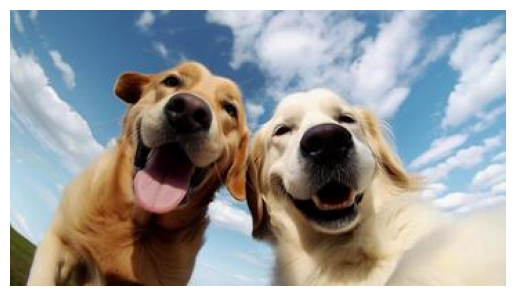

In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
image = cv2.imread(r"C:\Users\yuval\Downloads\dog.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.axis("off")
plt.show()


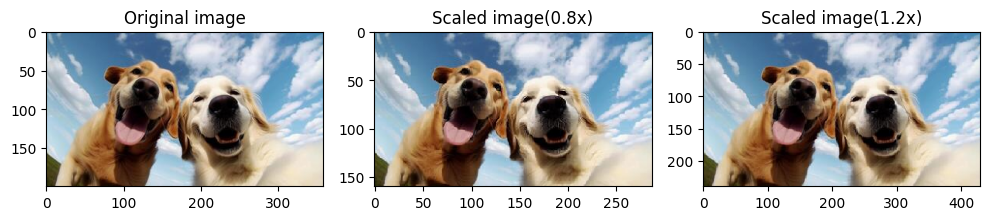

In [6]:

def scale_image(image, scale_factor):
    original_height, original_width = image.shape[:2]

    new_width = int(original_width * scale_factor)
    new_height = int(original_height * scale_factor)

    scaled_image = np.zeros((new_height, new_width, 3), dtype=image.dtype)

    for y in range(new_height):
        for x in range(new_width):
            original_x = x / scale_factor
            original_y = y / scale_factor
            
            original_x = int(np.round(original_x))
            original_y = int(np.round(original_y))

            if 0 <= original_x < original_width and 0 <= original_y < original_height:
                scaled_image[y, x] = image[original_y, original_x]

    return scaled_image

output_image1 = scale_image(image,0.8)
output_image2 = scale_image(image,1.2)

fig,axes = plt.subplots(1,3,figsize = (10,5))

axes[0].imshow(image)
axes[0].set_title('Original image')

axes[1].imshow(output_image1)
axes[1].set_title('Scaled image(0.8x)')

axes[2].imshow(output_image2)
axes[2].set_title('Scaled image(1.2x)')

plt.tight_layout()
plt.show()

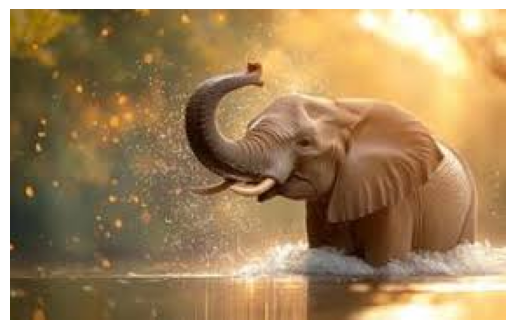

In [11]:
image = cv2.imread(r"C:\Users\yuval\Downloads\elephant_images.jpeg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.axis("off")
plt.show()


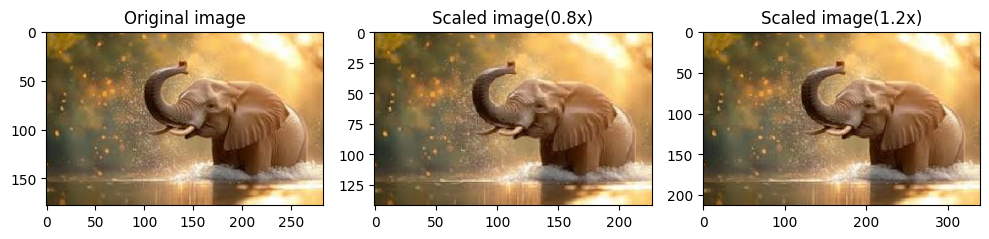

In [12]:

def scale_image(image, scale_factor):
    original_height, original_width = image.shape[:2]

    new_width = int(original_width * scale_factor)
    new_height = int(original_height * scale_factor)

    scaled_image = np.zeros((new_height, new_width, 3), dtype=image.dtype)

    for y in range(new_height):
        for x in range(new_width):
            original_x = x / scale_factor
            original_y = y / scale_factor
            
            original_x = int(np.round(original_x))
            original_y = int(np.round(original_y))

            if 0 <= original_x < original_width and 0 <= original_y < original_height:
                scaled_image[y, x] = image[original_y, original_x]

    return scaled_image

output_image1 = scale_image(image,0.8)
output_image2 = scale_image(image,1.2)

fig,axes = plt.subplots(1,3,figsize = (10,5))

axes[0].imshow(image)
axes[0].set_title('Original image')

axes[1].imshow(output_image1)
axes[1].set_title('Scaled image(0.8x)')

axes[2].imshow(output_image2)
axes[2].set_title('Scaled image(1.2x)')

plt.tight_layout()
plt.show()

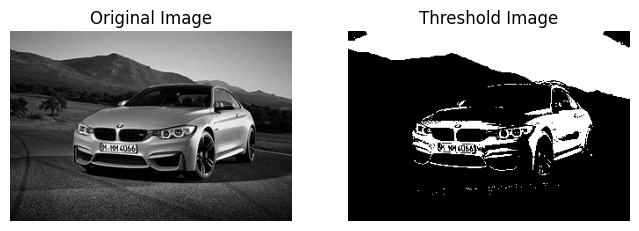

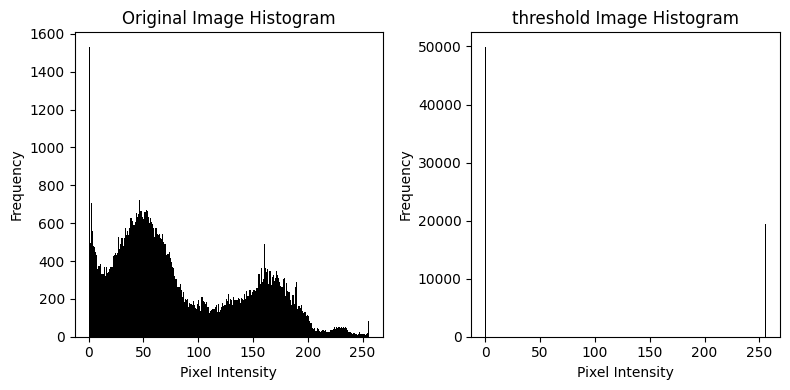

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread(r"C:\Users\yuval\Downloads\car.jpg", cv2.IMREAD_GRAYSCALE)


_, global_thresh = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(global_thresh , cmap='gray')
plt.title('Threshold Image')
plt.axis('off')

plt.show()
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1) 
plt.hist(image.ravel(), bins=256, range=[0, 256], color='black')
plt.title('Original Image Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)  
plt.hist(global_thresh .ravel(), bins=256, range=[0, 256], color='black')
plt.title('threshold Image Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.tight_layout()  

plt.show()





C:\Users\yuval\AppData\Local\Temp\ipykernel_21212\311399698.py:17: RuntimeWarning: overflow encountered in scalar add
  shifted_image[i, j] = np.clip(image[i, j] + shift_value, 0, 255)  # Prevent overflow


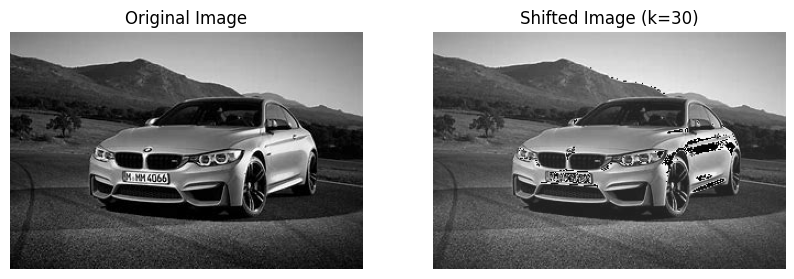

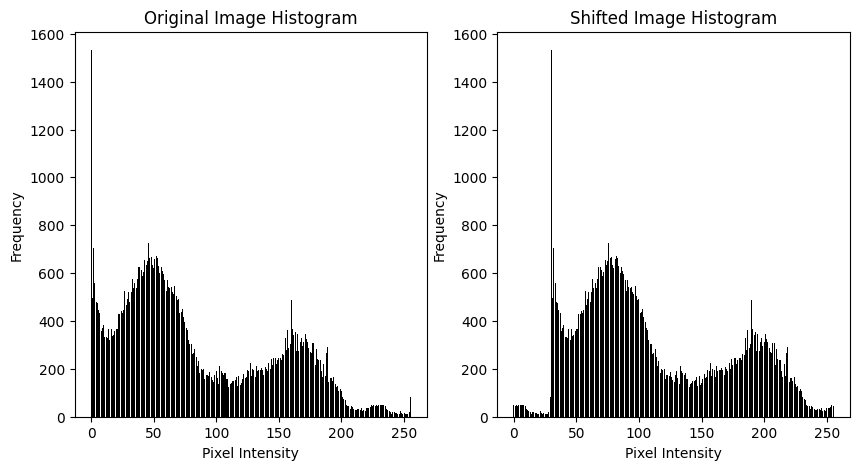

In [12]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load the image in grayscale
image = cv2.imread(r"C:\Users\yuval\Downloads\car.jpg", cv2.IMREAD_GRAYSCALE)


# Define the shift value
shift_value = 30

# Manually apply pixel-wise intensity shift
shifted_image = np.zeros_like(image)  # Create an empty array of the same shape
rows, cols = image.shape
for i in range(rows):
    for j in range(cols):
        shifted_image[i, j] = np.clip(image[i, j] + shift_value, 0, 255)  # Prevent overflow

# Display original and shifted images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(shifted_image, cmap='gray')
plt.title(f'Shifted Image (k={shift_value})')
plt.axis('off')

plt.show()

# Compute histograms manually
original_hist = [0] * 256
shifted_hist = [0] * 256

for i in range(rows):
    for j in range(cols):
        original_hist[image[i, j]] += 1
        shifted_hist[shifted_image[i, j]] += 1

# Plot histograms
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.bar(range(256), original_hist, color='black')
plt.title('Original Image Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.bar(range(256), shifted_hist, color='black')
plt.title('Shifted Image Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.show()


In [11]:

def manual_blur(img):
    blurred = np.zeros_like(img)
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            if channels == 1:
                blurred[i, j] = np.mean(img[i-1:i+2, j-1:j+2])
            else:
                for c in range(channels):
                    blurred[i, j, c] = np.mean(img[i-1:i+2, j-1:j+2, c])
    return blurred

smoothed_image = manual_blur(image)
smoothed_image_rgb = smoothed_image.copy() if channels == 1 else np.zeros_like(smoothed_image)
if channels > 1:
    for i in range(rows):
        for j in range(cols):
            smoothed_image_rgb[i, j] = smoothed_image[i, j][::-1]  # Convert BGR to RGB manually


plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb, cmap='gray' if channels == 1 else None)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(smoothed_image_rgb, cmap='gray' if channels == 1 else None)
plt.title('Smoothed Image')
plt.axis('off')
plt.show()

# Function to plot histogram
def plot_histogram(image, title):
    plt.hist(image.ravel(), bins=256, range=[0, 256], color='black')
    plt.title(title)
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')

plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plot_histogram(smoothed_image_rgb, 'Original Image Histogram')

plt.subplot(1, 2, 2)
plot_histogram(smoothed_image_rgb, 'Smoothed Image Histogram')

plt.tight_layout()
plt.show()


NameError: name 'channels' is not defined

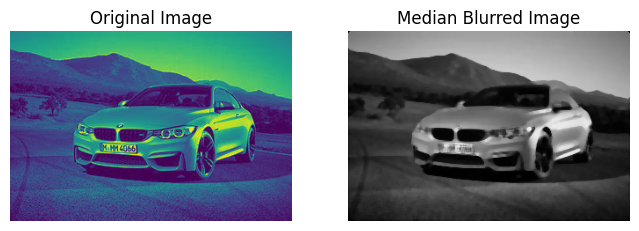

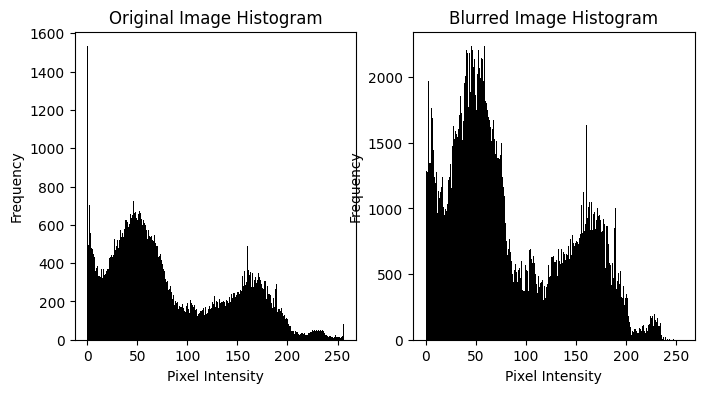

In [4]:


def manual_median_blur(image, ksize=5):
    if len(image.shape) == 2:  
        image = image[:, :, np.newaxis]
    
    rows, cols, channels = image.shape
    pad = ksize // 2
    padded_img = np.pad(image, ((pad, pad), (pad, pad), (0, 0)), mode='constant', constant_values=0)
    blurred = np.zeros_like(image)

    for i in range(rows):
        for j in range(cols):
            for c in range(channels):
                neighborhood = padded_img[i:i+ksize, j:j+ksize, c]
                blurred[i, j, c] = np.median(neighborhood)
    
    return blurred

median_blurred_image = manual_median_blur(image, 5)
median_blurred_image_rgb = cv2.cvtColor(median_blurred_image.astype(np.uint8), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(median_blurred_image_rgb)
plt.title('Median Blurred Image')
plt.axis('off')

plt.show()

plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1) 
plt.hist(image.ravel(), bins=256, range=[0, 256], color='black')
plt.title('Original Image Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)  
plt.hist(median_blurred_image_rgb.ravel(), bins=256, range=[0, 256], color='black')
plt.title('Blurred Image Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.tight_layout
plt.show()

In [ ]:

def manual_median_blur(image, ksize=5):
    if len(image.shape) == 2:  
        image = image[:, :, np.newaxis]
    
    rows, cols, channels = image.shape
    pad = ksize // 2
    padded_img = np.pad(image, ((pad, pad), (pad, pad), (0, 0)), mode='constant', constant_values=0)
    blurred = np.zeros_like(image)

    for i in range(rows):
        for j in range(cols):
            for c in range(channels):
                neighborhood = padded_img[i:i+ksize, j:j+ksize, c]
                blurred[i, j, c] = np.median(neighborhood)
    
    return blurred

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 

median_blurred_image = manual_median_blur(image, 5)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)  
plt.title('Original Image (RGB)')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(median_blurred_image)
plt.title('Median Blurred Image (RGB)')
plt.axis('off')

plt.show()
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1) 
plt.hist(image.ravel(), bins=256, range=[0, 256], color='black')
plt.title('Original Image Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)  
plt.hist(median_blurred_image.ravel(), bins=256, range=[0, 256], color='black')
plt.title('Blurred Image Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.tight_layout
plt.show()



(np.float64(-0.5), np.float64(320.5), np.float64(215.5), np.float64(-0.5))

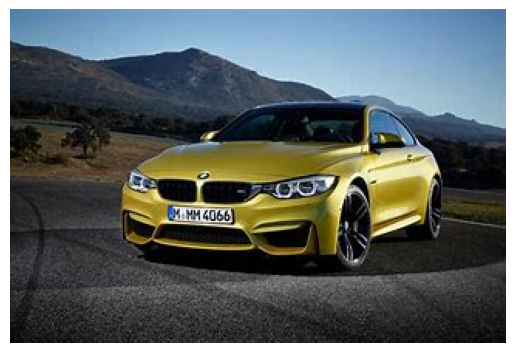

In [7]:
import cv2
import matplotlib.pyplot as plt
image = cv2.imread(r"C:\Users\yuval\Downloads\car.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.axis("off")


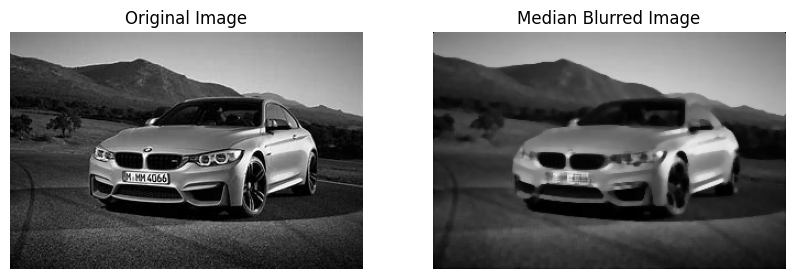

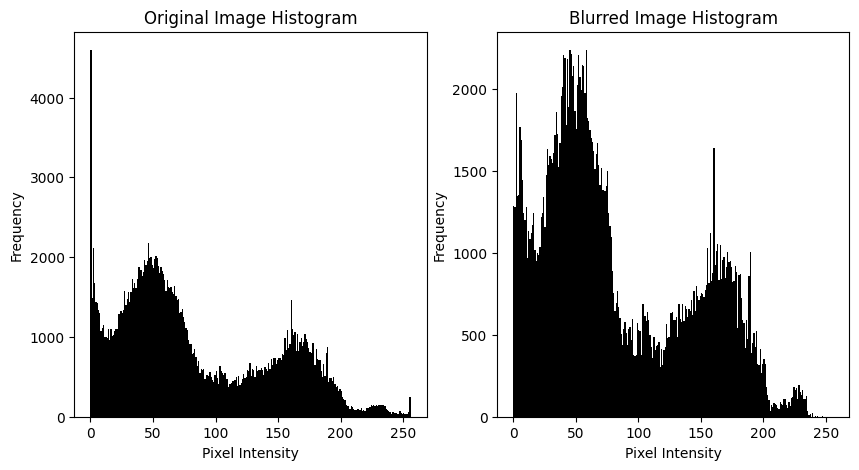

In [17]:

def manual_median_blur(image, ksize=5):
    if len(image.shape) == 2:  
        image = image[:, :, np.newaxis]
    
    rows, cols, channels = image.shape
    pad = ksize // 2
    padded_img = np.pad(image, ((pad, pad), (pad, pad), (0, 0)), mode='constant', constant_values=0)
    blurred = np.zeros_like(image)

    for i in range(rows):
        for j in range(cols):
            for c in range(channels):
                neighborhood = padded_img[i:i+ksize, j:j+ksize, c]
                blurred[i, j, c] = np.median(neighborhood)
    
    return blurred

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 

median_blurred_image = manual_median_blur(image, 5)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)  
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(median_blurred_image)
plt.title('Median Blurred Image')
plt.axis('off')

plt.show()
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1) 
plt.hist(image.ravel(), bins=256, range=[0, 256], color='black')
plt.title('Original Image Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)  
plt.hist(median_blurred_image.ravel(), bins=256, range=[0, 256], color='black')
plt.title('Blurred Image Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.tight_layout
plt.show()



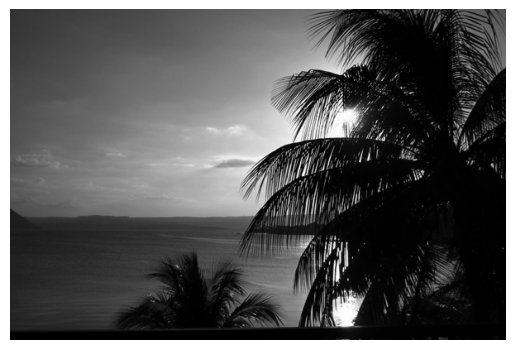

In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
image = cv2.imread(r"C:\Users\yuval\Downloads\img.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.imshow(image,cmap='gray')
plt.axis("off")
plt.show()


In [3]:
def add_gaussian_noise(image):
    row, col = image.shape
    mean = 0
    sigma = 25  
    gauss = np.random.normal(mean, sigma, (row, col))
    noisy = np.clip(image + gauss, 0, 255)
    return noisy.astype(np.uint8)


In [4]:
def add_rayleigh_noise(image):
    row, col = image.shape
    sigma = 25
    rayleigh = np.random.rayleigh(sigma, (row, col))
    noisy = np.clip(image + rayleigh, 0, 255)
    return noisy.astype(np.uint8)


In [5]:
def add_gamma_noise(image):
    row, col = image.shape
    shape = 2
    scale = 25
    gamma = np.random.gamma(shape, scale, (row, col))
    noisy = np.clip(image + gamma, 0, 255)
    return noisy.astype(np.uint8)


In [6]:
def add_exponential_noise(image):
    row, col = image.shape
    scale = 25
    exp_noise = np.random.exponential(scale, (row, col))
    noisy = np.clip(image + exp_noise, 0, 255)
    return noisy.astype(np.uint8)


In [7]:
def add_uniform_noise(image):
    row, col = image.shape
    low = -25
    high = 25
    uniform = np.random.uniform(low, high, (row, col))
    noisy = np.clip(image + uniform, 0, 255)
    return noisy.astype(np.uint8)


In [8]:
def add_impulse_noise(image):
    row, col = image.shape
    output = np.copy(image)
    prob = 0.1
   
    black = np.random.rand(row, col) < prob / 2
    white = np.random.rand(row, col) < prob / 2
    output[black] = 0  
    output[white] = 255  
    return output


In [9]:
gaussian_noisy = add_gaussian_noise(image)
rayleigh_noisy = add_rayleigh_noise(image)
gamma_noisy = add_gamma_noise(image)
exponential_noisy = add_exponential_noise(image)
uniform_noisy = add_uniform_noise(image)
impulse_noisy = add_impulse_noise(image)


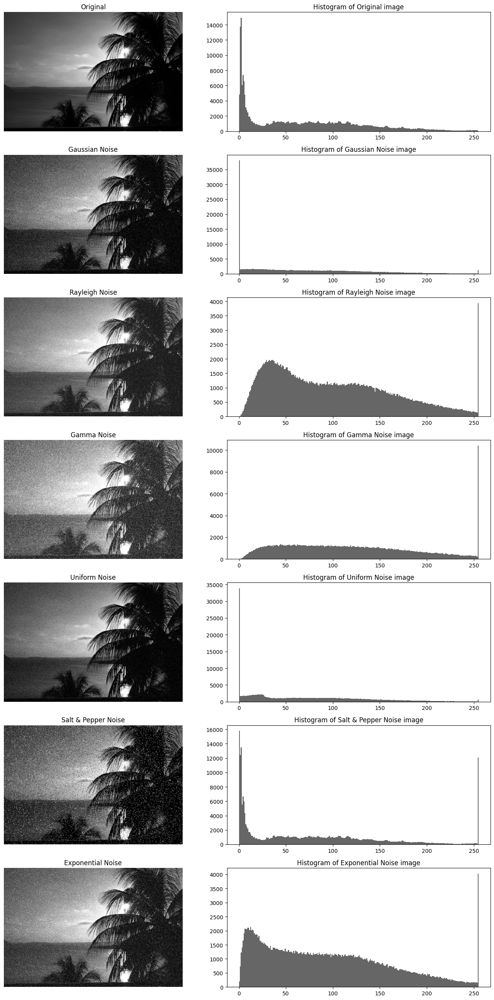

In [10]:
fig, axes = plt.subplots(7, 2, figsize=(14, 26))

titles = ["Original", "Gaussian Noise", "Rayleigh Noise",
          "Gamma Noise", "Uniform Noise", "Salt & Pepper Noise", "Exponential Noise"]
images = [image, gaussian_noisy, rayleigh_noisy,
          gamma_noisy, uniform_noisy, impulse_noisy, exponential_noisy]

for i in range(7):
    axes[i][0].imshow(images[i], cmap="gray")
    axes[i][0].set_title(titles[i])
    axes[i][0].axis("off")
   
    axes[i][1].hist(images[i].ravel(),bins = 256,color = 'black',alpha = 0.6)
    axes[i][1].set_title(f"Histogram of {titles[i]} image")

plt.tight_layout()
plt.show()


In [11]:
!pip install scipy



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [12]:
from scipy.signal import wiener

image = cv2.imread(r"C:\Users\yuval\Downloads\img.jpg", cv2.IMREAD_GRAYSCALE)



In [13]:
def manual_mean_filter(image, kernel_size=5):
    pad = kernel_size // 2
    padded_image = np.pad(image, pad, mode='edge')  
    filtered_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i+kernel_size, j:j+kernel_size]
            filtered_image[i, j] = np.mean(region)
    
    return filtered_image.astype(np.uint8)

In [14]:
def manual_gaussian_filter(image, kernel_size=5, sigma=1):
    pad = kernel_size // 2
    x, y = np.mgrid[-pad:pad+1, -pad:pad+1]
    gaussian_kernel = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    gaussian_kernel /= gaussian_kernel.sum()  
    
    padded_image = np.pad(image, pad, mode='edge')
    filtered_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i+kernel_size, j:j+kernel_size]
            filtered_image[i, j] = np.sum(region * gaussian_kernel)
    
    return filtered_image.astype(np.uint8)

In [15]:
def manual_median_filter(image, kernel_size=5):
    pad = kernel_size // 2
    padded_image = np.pad(image, pad, mode='edge')
    filtered_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i+kernel_size, j:j+kernel_size]
            filtered_image[i, j] = np.median(region)
    
    return filtered_image.astype(np.uint8)

In [16]:
def manual_bilateral_filter(image, d=9, sigma_color=75, sigma_space=75):
    return cv2.bilateralFilter(image, d, sigma_color, sigma_space)

In [17]:
titles = ["Original Noisy", "Mean Filter", "Gaussian Filter", "Median Filter", "Bilateral Filter"]
images = [image, mean_filtered, gaussian_filtered, median_filtered, bilateral_filtered]

# Display images
fig, axes = plt.subplots(5, 2, figsize=(14, 15))

for i in range(5):
    axes[i, 0].imshow(images[i], cmap="gray")
    axes[i, 0].set_title(titles[i])
    axes[i, 0].axis("off")

    axes[i, 1].hist(images[i].ravel(), bins=256, color='black', alpha=0.7)
    axes[i, 1].set_title(f"Histogram of {titles[i]} Image")

plt.tight_layout()
plt.show()

NameError: name 'mean_filtered' is not defined

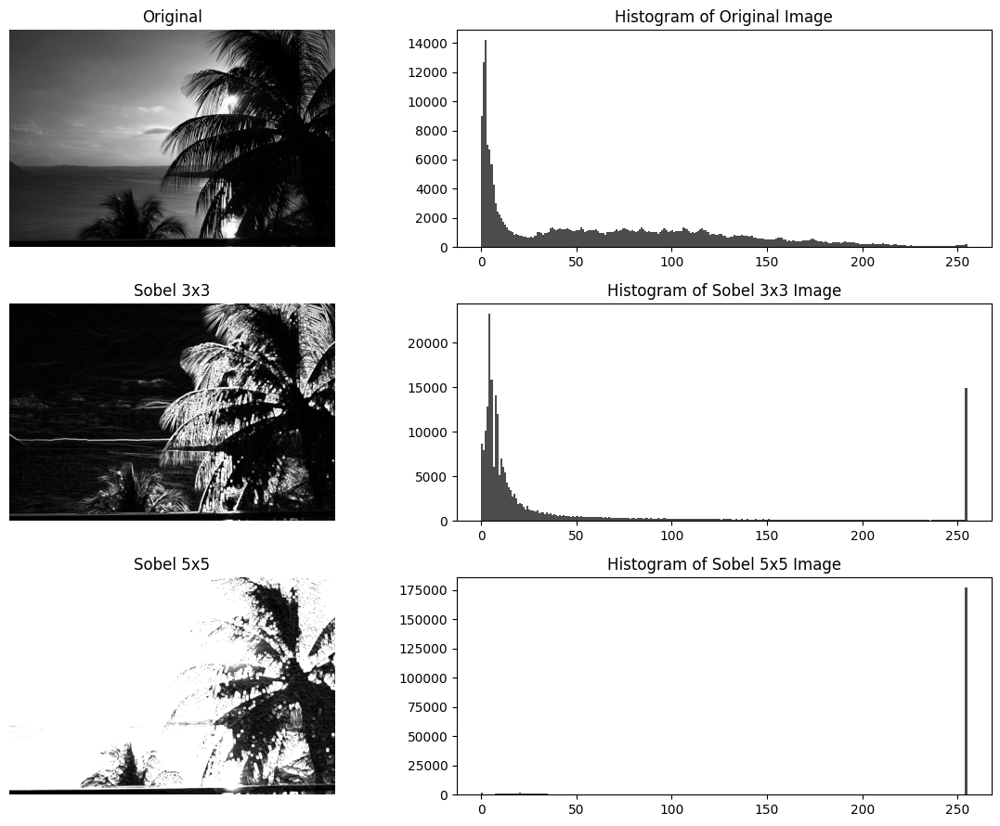

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread(r"C:\Users\yuval\Downloads\img.jpg", cv2.IMREAD_GRAYSCALE)

sobel_x_3x3 = np.array([[-1, 0, 1], 
                         [-2, 0, 2], 
                         [-1, 0, 1]])

sobel_y_3x3 = np.array([[1, 2, 1], 
                         [ 0,  0,  0], 
                         [ -1,  -2,  -1]])

sobel_x_5x5 = np.array([[-1, -2, 0, 2, 1],
                         [-2, -3, 0, 3, 2],
                         [-3, -5, 0, 5, 3],
                         [-2, -3, 0, 3, 2],
                         [-1, -2, 0, 2, 1]])

sobel_y_5x5 = np.array([[1, 2, 3, 2, 1],
                         [2, 3, 5, 3, 2],
                         [ 0,  0,  0,  0,  0],
                         [ -2, -3, -5, 3, 2],
                         [-1, -2, -3, -2, -1]])

def apply_convolution(image, kernel):
    pad = kernel.shape[0] // 2
    padded_image = np.pad(image, pad, mode='edge')
    result = np.zeros_like(image, dtype=np.float64)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i+kernel.shape[0], j:j+kernel.shape[1]]
            result[i, j] = np.sum(region * kernel)
    
    return result

grad_x_3x3 = apply_convolution(image, sobel_x_3x3)
grad_y_3x3 = apply_convolution(image, sobel_y_3x3)
sobel_mag_3x3 = np.sqrt(grad_x_3x3**2 + grad_y_3x3**2)

grad_x_5x5 = apply_convolution(image, sobel_x_5x5)
grad_y_5x5 = apply_convolution(image, sobel_y_5x5)
sobel_mag_5x5 = np.sqrt(grad_x_5x5**2 + grad_y_5x5**2)

sobel_mag_3x3 = np.clip(sobel_mag_3x3, 0, 255).astype(np.uint8)
sobel_mag_5x5 = np.clip(sobel_mag_5x5, 0, 255).astype(np.uint8)

titles = ["Original", "Sobel 3x3", "Sobel 5x5"]
images = [image, sobel_mag_3x3, sobel_mag_5x5]

fig, axes = plt.subplots(3, 2, figsize=(12, 9))

for i in range(3):
   
    axes[i, 0].imshow(images[i], cmap="gray")
    axes[i, 0].set_title(titles[i])
    axes[i, 0].axis("off")

    axes[i, 1].hist(images[i].ravel(), bins=256, color='black', alpha=0.7)
    axes[i, 1].set_title(f"Histogram of {titles[i]} Image")

plt.tight_layout()
plt.show()


In [ ]:
from scipy.signal import wiener

rayleigh_restored = cv2.medianBlur(rayleigh_noisy, 5)
gamma_restored = cv2.bilateralFilter(gamma_noisy, d=9, sigmaColor=75, sigmaSpace=75)
uniform_restored = cv2.blur(uniform_noisy, (5, 5))
impulse_restored = cv2.medianBlur(impulse_noisy, 5)
gaussian_restored = cv2.bilateralFilter(gaussian_noisy, d=9, sigmaColor=75, sigmaSpace=75)
exponential_restored = cv2.bilateralFilter(exponential_noisy, d=9, sigmaColor=75, sigmaSpace=75)

titles = ["Original Image","Gaussian Noise", "Rayleigh Noise", "Gamma Noise", "Uniform Noise", "Impulse Noise", "Exponential Noise"]
restored_images = [image , gaussian_restored, rayleigh_restored, gamma_restored, uniform_restored, impulse_restored, exponential_restored]

fig, axes = plt.subplots(7, 2, figsize=(14,26))

axes[0,0].imshow(restored_images[0], cmap="gray")
axes[0,0].set_title(f"{titles[0]}")
axes[0,0].axis("off")

axes[0,1].hist(restored_images[0].ravel(),bins = 256 , color = 'black',alpha = 0.6)
axes[0,1].set_title("Histogram of image")

for i in range(1,7):   
    axes[i,0].imshow(restored_images[i], cmap="gray")
    axes[i,0].set_title(f"{titles[i]} (Restored)")
    axes[i,0].axis("off")

    axes[i,1].hist(restored_images[i].ravel(),bins = 256 , color = 'black',alpha = 0.6)
    axes[i,1].set_title("Histogram of image")

plt.tight_layout()
plt.show()

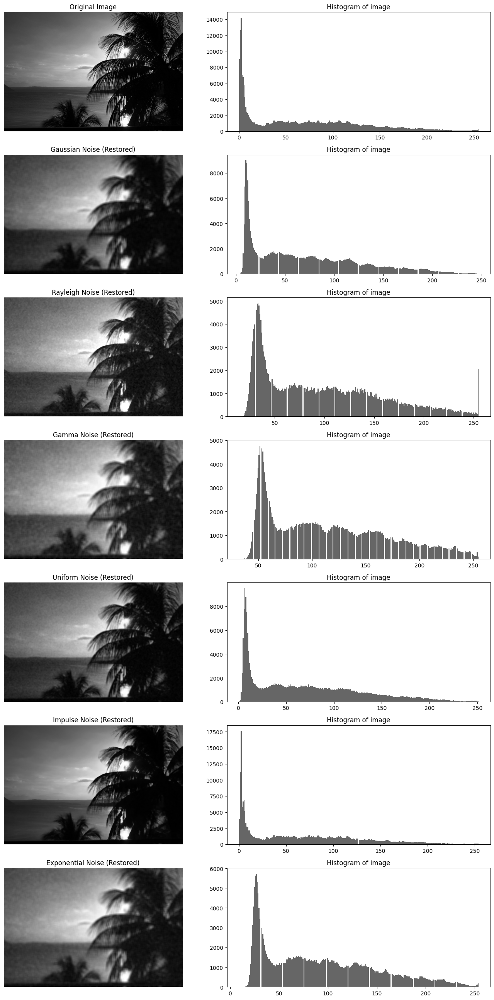

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

def manual_median_filter(image, kernel_size=5):
    pad_size = kernel_size // 2
    padded_img = np.pad(image, pad_size, mode='edge')
    filtered_img = np.zeros_like(image)
    
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            filtered_img[i, j] = np.median(padded_img[i:i+kernel_size, j:j+kernel_size])
    
    return filtered_img

def manual_mean_filter(image, kernel_size=5):
    kernel = np.ones((kernel_size, kernel_size)) / (kernel_size ** 2)
    return convolve2d(image, kernel, mode='same', boundary='symm')

def manual_bilateral_filter(image, d=9, sigmaColor=75, sigmaSpace=75):
    rows, cols = image.shape
    filtered_img = np.zeros_like(image, dtype=np.float32)
    pad_size = d // 2
    padded_img = np.pad(image, pad_size, mode='edge')
    
    for i in range(rows):
        for j in range(cols):
            patch = padded_img[i:i+d, j:j+d]
            intensity_diff = patch - image[i, j]
            spatial_weights = np.exp(-((np.arange(-pad_size, pad_size+1)**2)/(2*sigmaSpace**2)))
            spatial_weights = np.outer(spatial_weights, spatial_weights)
            intensity_weights = np.exp(-(intensity_diff**2) / (2 * sigmaColor**2))
            
            weights = spatial_weights * intensity_weights
            filtered_img[i, j] = np.sum(patch * weights) / np.sum(weights)
    
    return filtered_img.astype(np.uint8)

rayleigh_restored = manual_median_filter(rayleigh_noisy, 5)
gamma_restored = manual_bilateral_filter(gamma_noisy, d=9, sigmaColor=75, sigmaSpace=75)
uniform_restored = manual_mean_filter(uniform_noisy, 5)
impulse_restored = manual_median_filter(impulse_noisy, 5)
gaussian_restored = manual_bilateral_filter(gaussian_noisy, d=9, sigmaColor=75, sigmaSpace=75)
exponential_restored = manual_bilateral_filter(exponential_noisy, d=9, sigmaColor=75, sigmaSpace=75)

titles = ["Original Image", "Gaussian Noise", "Rayleigh Noise", "Gamma Noise", "Uniform Noise", "Impulse Noise", "Exponential Noise"]
restored_images = [image, gaussian_restored, rayleigh_restored, gamma_restored, uniform_restored, impulse_restored, exponential_restored]

fig, axes = plt.subplots(7, 2, figsize=(14,26))

axes[0,0].imshow(restored_images[0], cmap="gray")
axes[0,0].set_title(f"{titles[0]}")
axes[0,0].axis("off")

axes[0,1].hist(restored_images[0].ravel(), bins=256, color='black', alpha=0.6)
axes[0,1].set_title("Histogram of image")

for i in range(1,7):
    axes[i,0].imshow(restored_images[i], cmap="gray")
    axes[i,0].set_title(f"{titles[i]} (Restored)")
    axes[i,0].axis("off")

    axes[i,1].hist(restored_images[i].ravel(), bins=256, color='black', alpha=0.6)
    axes[i,1].set_title("Histogram of image")

plt.tight_layout()
plt.show()


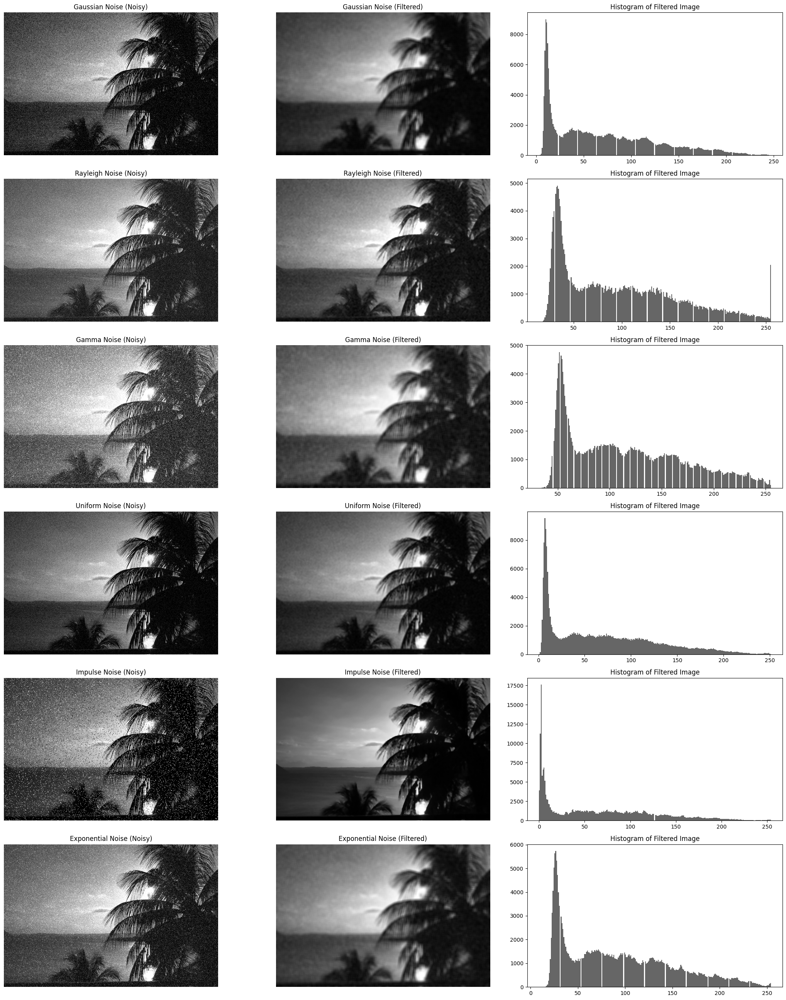

In [20]:

from scipy.signal import convolve2d

def manual_median_filter(image, kernel_size=5):
    pad_size = kernel_size // 2
    padded_img = np.pad(image, pad_size, mode='edge')
    filtered_img = np.zeros_like(image)
    
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            filtered_img[i, j] = np.median(padded_img[i:i+kernel_size, j:j+kernel_size])
    
    return filtered_img

def manual_mean_filter(image, kernel_size=5):
    kernel = np.ones((kernel_size, kernel_size)) / (kernel_size ** 2)
    return convolve2d(image, kernel, mode='same', boundary='symm')

def manual_bilateral_filter(image, d=9, sigmaColor=75, sigmaSpace=75):
    rows, cols = image.shape
    filtered_img = np.zeros_like(image, dtype=np.float32)
    pad_size = d // 2
    padded_img = np.pad(image, pad_size, mode='edge')
    
    for i in range(rows):
        for j in range(cols):
            patch = padded_img[i:i+d, j:j+d]
            intensity_diff = patch - image[i, j]
            spatial_weights = np.exp(-((np.arange(-pad_size, pad_size+1)**2)/(2*sigmaSpace**2)))
            spatial_weights = np.outer(spatial_weights, spatial_weights)
            intensity_weights = np.exp(-(intensity_diff**2) / (2 * sigmaColor**2))
            
            weights = spatial_weights * intensity_weights
            filtered_img[i, j] = np.sum(patch * weights) / np.sum(weights)
    
    return filtered_img.astype(np.uint8)

noisy_images = [gaussian_noisy, rayleigh_noisy, gamma_noisy, uniform_noisy, impulse_noisy, exponential_noisy]
filtered_images = [
    manual_bilateral_filter(gaussian_noisy, d=9, sigmaColor=75, sigmaSpace=75),
    manual_median_filter(rayleigh_noisy, 5),
    manual_bilateral_filter(gamma_noisy, d=9, sigmaColor=75, sigmaSpace=75),
    manual_mean_filter(uniform_noisy, 5),
    manual_median_filter(impulse_noisy, 5),
    manual_bilateral_filter(exponential_noisy, d=9, sigmaColor=75, sigmaSpace=75)
]

titles = ["Gaussian Noise", "Rayleigh Noise", "Gamma Noise", "Uniform Noise", "Impulse Noise", "Exponential Noise"]

fig, axes = plt.subplots(6, 3, figsize=(21, 26))

for i in range(6):
    axes[i, 0].imshow(noisy_images[i], cmap="gray")
    axes[i, 0].set_title(f"{titles[i]} (Noisy)")
    axes[i, 0].axis("off")
    
    axes[i, 1].imshow(filtered_images[i], cmap="gray")
    axes[i, 1].set_title(f"{titles[i]} (Filtered)") 
    axes[i, 1].axis("off")
    
    axes[i, 2].hist(filtered_images[i].ravel(), bins=256, color='black', alpha=0.6)
    axes[i, 2].set_title("Histogram of Filtered Image")

plt.tight_layout()
plt.show()


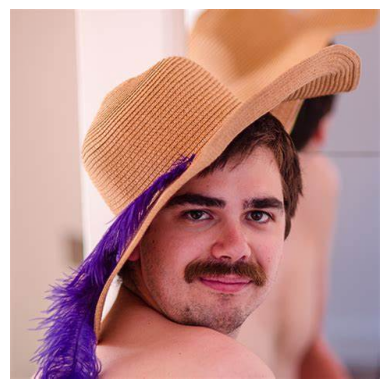

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
image=cv2.imread("img1.jpeg")
image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.axis('off')
plt.show()




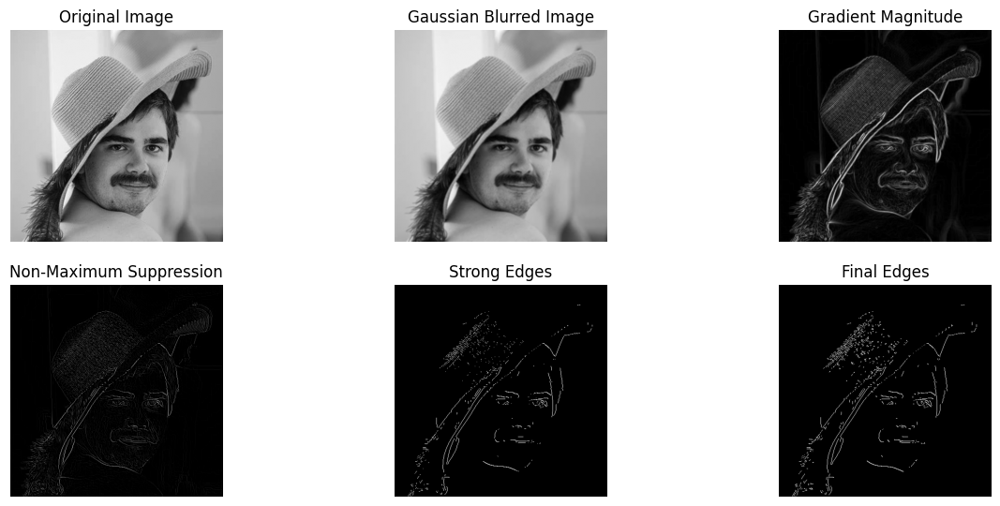

In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def gaussian_blur(image, kernel_size=5, sigma=1.0):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)

def sobel_gradient(image):
    grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)  
    grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)  
    
    grad_mag = cv2.magnitude(grad_x, grad_y)  
    grad_dir = cv2.phase(grad_x, grad_y, angleInDegrees=True)  
    return grad_mag, grad_dir

def non_maximum_suppression(grad_mag, grad_dir):
    rows, cols = grad_mag.shape
    output = np.zeros_like(grad_mag)
    
    grad_dir = np.round(grad_dir) % 180
    
    for i in range(1, rows-1):
        for j in range(1, cols-1):
            angle = grad_dir[i, j]
            if (0 <= angle < 45) or (135 <= angle < 180):
                p1, p2 = grad_mag[i, j+1], grad_mag[i, j-1]
            elif (45 <= angle < 90) or (90 <= angle < 135):
                p1, p2 = grad_mag[i+1, j-1], grad_mag[i-1, j+1]

            if grad_mag[i, j] >= p1 and grad_mag[i, j] >= p2:
                output[i, j] = grad_mag[i, j]
            else:
                output[i, j] = 0
    
    return output

def double_thresholding(grad_mag, low_threshold, high_threshold):
    strong_edges = np.zeros_like(grad_mag)
    weak_edges = np.zeros_like(grad_mag)
    
    strong_edges[grad_mag >= high_threshold] = 1
    weak_edges[(grad_mag >= low_threshold) & (grad_mag < high_threshold)] = 1
    
    return strong_edges, weak_edges

def hysteresis(strong_edges, weak_edges):
    rows, cols = strong_edges.shape
    final_edges = np.copy(strong_edges)
    
    for i in range(1, rows-1):
        for j in range(1, cols-1):
            if weak_edges[i, j] == 1:
                if np.any(strong_edges[i-1:i+2, j-1:j+2]):
                    final_edges[i, j] = 1
    
    return final_edges

def canny_edge_detection(image, low_threshold=50, high_threshold=150, kernel_size=5, sigma=1.0):

    image = np.float32(image)
    blurred_image = gaussian_blur(image, kernel_size, sigma)

    grad_mag, grad_dir = sobel_gradient(blurred_image)

    nms_edges = non_maximum_suppression(grad_mag, grad_dir)

    strong_edges, weak_edges = double_thresholding(nms_edges, low_threshold, high_threshold)

    final_edges = hysteresis(strong_edges, weak_edges)

    steps = [
        ("Original Image", image),
        ("Gaussian Blurred Image", blurred_image),
        ("Gradient Magnitude", grad_mag),
        ("Non-Maximum Suppression", nms_edges),
        ("Strong Edges", strong_edges),
        ("Final Edges", final_edges)
    ]
    
    plt.figure(figsize=(15, 10))
    for i, (title, img) in enumerate(steps, 1):
        plt.subplot(3, 3, i)
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')
    
    plt.show()

image_path = 'img1.jpeg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

canny_edge_detection(image)


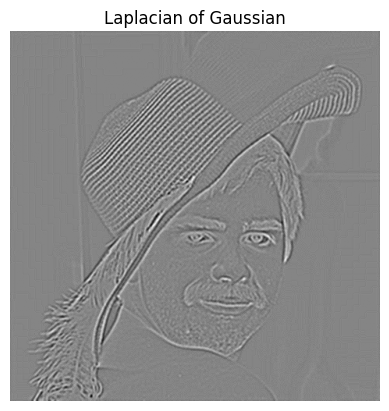

In [5]:
def apply_gaussian_blur(image, sigma, kernel_size=(5,5)):
    
     return cv2.GaussianBlur(image,kernel_size, sigma)
def laplacian_filter(image):
    return cv2.Laplacian(image, cv2.CV_64F)

def laplacian_of_gaussian(image, sigma):
    blurred_image = apply_gaussian_blur(image, sigma)
    log_image = laplacian_filter(blurred_image)
    return log_image


sigma = 1.4
log_result = laplacian_of_gaussian(image, sigma)

plt.imshow(log_result, cmap='gray')
plt.title("Laplacian of Gaussian")
plt.axis('off')
plt.show()


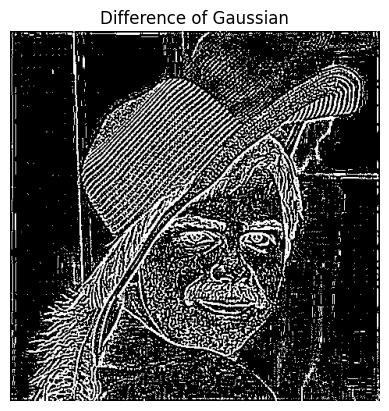

In [6]:
def apply_gaussian_blur(image, sigma, kernel_size=(5,5)):
    
     return cv2.GaussianBlur(image,kernel_size, sigma)  

def difference_of_gaussians(image, sigma1, sigma2):
    blurred_image_1 = apply_gaussian_blur(image, sigma1)
    blurred_image_2 = apply_gaussian_blur(image, sigma2)
    dog_image = blurred_image_1 - blurred_image_2
    return dog_image

def dog(image, sigma1, sigma2):
    dog_result = difference_of_gaussians(image, sigma1, sigma2)
    return dog_result



sigma1 = 1.0
sigma2 = 2.0
dog_result = dog(image, sigma1, sigma2)

plt.imshow(dog_result, cmap='gray')
plt.title("Difference of Gaussian")
plt.axis('off')
plt.show()


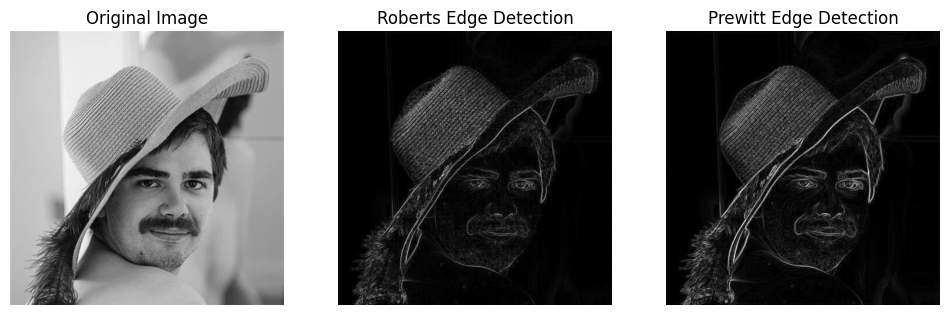

In [8]:
def roberts_filter(image):

    kernel_x = np.array([[1, 0], [0, -1]], dtype=np.float32)
    kernel_y = np.array([[0, 1], [-1, 0]], dtype=np.float32)

    grad_x = cv2.filter2D(image, cv2.CV_64F, kernel_x)
    grad_y = cv2.filter2D(image, cv2.CV_64F, kernel_y)

    roberts_edge = np.sqrt(grad_x**2 + grad_y**2)
    roberts_edge = cv2.normalize(roberts_edge, None, 0, 255, cv2.NORM_MINMAX)
    
    return np.uint8(roberts_edge)

def prewitt_filter(image):
    
    kernel_x = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]], dtype=np.float32)
    kernel_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]], dtype=np.float32)

    grad_x = cv2.filter2D(image, cv2.CV_64F, kernel_x)
    grad_y = cv2.filter2D(image, cv2.CV_64F, kernel_y)

    prewitt_edge = np.sqrt(grad_x**2 + grad_y**2)
    prewitt_edge = cv2.normalize(prewitt_edge, None, 0, 255, cv2.NORM_MINMAX)
    
    return np.uint8(prewitt_edge)
    
image_path = 'img1.jpeg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

filters = {
    "Original Image": image,
    "Roberts Edge Detection": roberts_filter(image),
    "Prewitt Edge Detection": prewitt_filter(image)
}

plt.figure(figsize=(12, 6))
for i, (title, result) in enumerate(filters.items(), 1):
    plt.subplot(1, 3, i)
    plt.imshow(result, cmap='gray')
    plt.title(title)
    plt.axis('off')

plt.show()



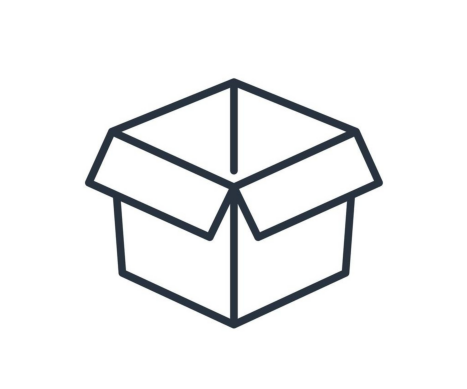

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread(r"C:\Users\yuval\OneDrive\Pictures\box.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.axis('off')  
plt.show()


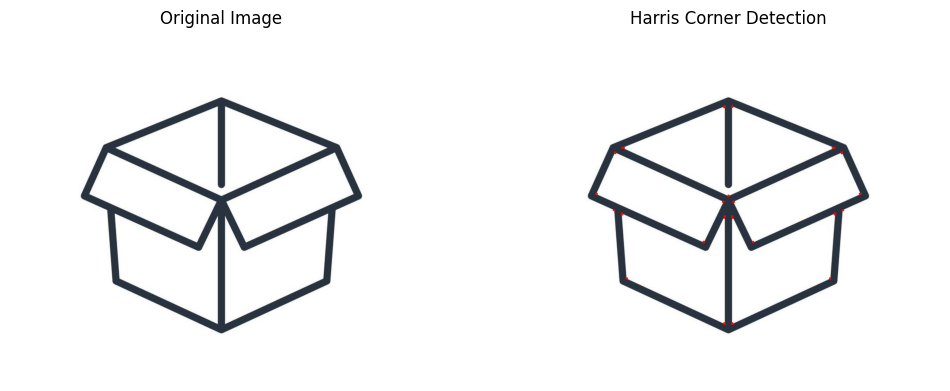

In [3]:

image_path = r"C:\Users\yuval\OneDrive\Pictures\box.jpg"
image = cv2.imread(image_path)


image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)

harris_corners = cv2.cornerHarris(gray, blockSize=3, ksize=3, k=0.04)

harris_corners = cv2.dilate(harris_corners, None)

image_with_corners = image_rgb.copy()
image_with_corners[harris_corners > 0.01 * harris_corners.max()] = [255, 0, 0]

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Original Image
axes[0].imshow(image_rgb)
axes[0].set_title("Original Image")
axes[0].axis('off')

# Image with Harris Corners
axes[1].imshow(image_with_corners)
axes[1].set_title("Harris Corner Detection")
axes[1].axis('off')

plt.show()


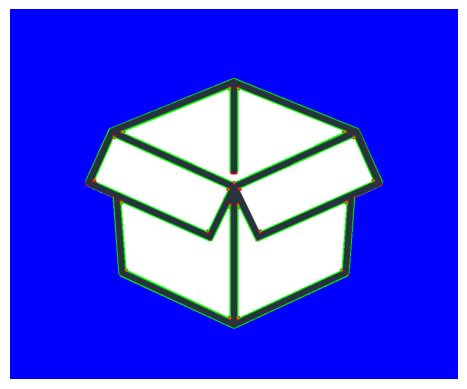

In [4]:

image_path = r"C:\Users\yuval\OneDrive\Pictures\box.jpg"

image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)

corners = cv2.cornerHarris(gray, blockSize=5, ksize=3, k=0.04)
corners = cv2.dilate(corners, None)
image_rgb[corners > 0.005 * corners.max()] = [255, 0, 0]  # Bright red corners

edges = cv2.Canny(gray, 50, 150)
lines = cv2.HoughLinesP(edges, 1, np.pi / 180, 80, minLineLength=50, maxLineGap=10)

if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(image_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)

def region_growing(image, seed, threshold=20):
    h, w = image.shape
    mask = np.zeros_like(image)
    stack = [seed]
    seed_value = image[seed]

    while stack:
        x, y = stack.pop()
        if mask[x, y] == 0 and abs(int(image[x, y]) - int(seed_value)) <= threshold:
            mask[x, y] = 255
            for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
                nx, ny = x + dx, y + dy
                if 0 <= nx < h and 0 <= ny < w:
                    stack.append((nx, ny))
    return mask

segmented = region_growing(gray, (100, 100))
image_rgb[segmented == 255] = [0, 0, 255]

plt.imshow(image_rgb)
plt.axis('off')
plt.show()


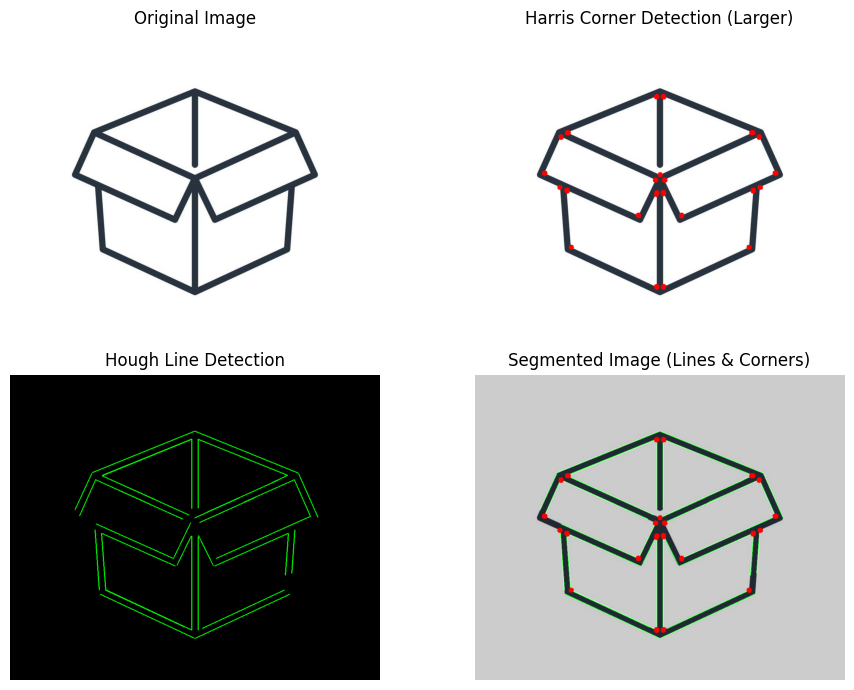

In [5]:
image_path = r"C:\Users\yuval\OneDrive\Pictures\box.jpg" 
image = cv2.imread(image_path) 
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  
gray_float = np.float32(gray)   
dst = cv2.cornerHarris(gray_float, blockSize=2, ksize=3, k=0.04) 
dst = cv2.dilate(dst, None) 
corner_image = image.copy() 
threshold = 0.01 * dst.max() 
for y, x in np.argwhere(dst > threshold): 
    cv2.circle(corner_image, (x, y), 5, (0, 0, 255), -1)  
edges = cv2.Canny(gray, 50, 150, apertureSize=3) 

lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=80, 
minLineLength=30, maxLineGap=5) 
line_image = np.zeros_like(image) 
if lines is not None: 
    for line in lines: 
        x1, y1, x2, y2 = line[0] 
        cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 2) 
segmented_image = image.copy() 
segmented_image = cv2.addWeighted(segmented_image, 0.8, line_image, 1, 
0)   
for y, x in np.argwhere(dst > threshold): 
    cv2.circle(segmented_image, (x, y), 5, (0, 0, 255), -1)   
fig, axes = plt.subplots(2, 2, figsize=(10, 7)) 
axes[0, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) 
axes[0, 0].set_title("Original Image") 
axes[0, 0].axis("off") 
axes[0, 1].imshow(cv2.cvtColor(corner_image, cv2.COLOR_BGR2RGB)) 
axes[0, 1].set_title("Harris Corner Detection (Larger)") 
axes[0, 1].axis("off") 
axes[1, 0].imshow(cv2.cvtColor(line_image, cv2.COLOR_BGR2RGB)) 
axes[1, 0].set_title("Hough Line Detection") 
axes[1, 0].axis("off") 
axes[1, 1].imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB)) 
axes[1, 1].set_title("Segmented Image (Lines & Corners)") 
axes[1, 1].axis("off") 
 
plt.tight_layout() 
plt.show()

In [ ]:
import cv2
import numpy as np
import os
from skimage.feature import hog
from sklearn.ensemble import RandomForestClassifier as Forest
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

folder_path = r"C:\Users\subha\Downloads\dataset"
categories = os.listdir(folder_path)

feature_matrix, labels = [], []

for index, category in enumerate(categories):
    category_path = os.path.join(folder_path, category)
    image_files = os.listdir(category_path)
    
    for file_name in image_files:
        file_path = os.path.join(category_path, file_name)
        picture = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
        picture = cv2.resize(picture, (128, 128))
        
        extractor = cv2.SIFT_create()
        keypoints, descriptors = extractor.detectAndCompute(picture, None)
        sift_descriptor = np.mean(descriptors, axis=0) if descriptors is not None else np.zeros((128,))
        
        feature_vector, _ = hog(picture, pixels_per_cell=(8, 8), cells_per_block=(2, 2), orientations=9, visualize=True)
        
        keypoints, descriptors = extractor.detectAndCompute(picture, None)
        gloh_descriptor = np.var(descriptors, axis=0) if descriptors is not None else np.zeros((128,))
        
        full_feature = np.hstack((sift_descriptor, feature_vector, gloh_descriptor))
        feature_matrix.append(full_feature)
        labels.append(index)

feature_matrix = np.array(feature_matrix)
labels = np.array(labels)

normalizer = StandardScaler()
feature_matrix = normalizer.fit_transform(feature_matrix)

X_train, X_test, y_train, y_test = train_test_split(feature_matrix, labels, test_size=0.2, random_state=42)

classifier = Forest(n_estimators=100, random_state=42)
classifier.fit(X_train, y_train)

y_pred = classifier.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Training Completed. Accuracy: {accuracy:.4f}")

def identify_picture(image_path):
    picture = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    picture = cv2.resize(picture, (128, 128))
    
    extractor = cv2.SIFT_create()
    keypoints, descriptors = extractor.detectAndCompute(picture, None)
    sift_descriptor = np.mean(descriptors, axis=0) if descriptors is not None else np.zeros((128,))
    
    feature_vector, _ = hog(picture, pixels_per_cell=(8, 8), cells_per_block=(2, 2), orientations=9, visualize=True)
    
    keypoints, descriptors = extractor.detectAndCompute(picture, None)
    gloh_descriptor = np.var(descriptors, axis=0) if descriptors is not None else np.zeros((128,))
    
    full_feature = np.hstack((sift_descriptor, feature_vector, gloh_descriptor)).reshape(1, -1)
    full_feature = normalizer.transform(full_feature)
    
    predicted_label = classifier.predict(full_feature)[0]
    predicted_category = categories[predicted_label]
    
    print(f"Predicted Category: {predicted_category}")

sample_image = r"C:\Users\subha\Downloads\download (4).jpeg"
loaded_picture = cv2.imread(sample_image)
loaded_picture = cv2.cvtColor(loaded_picture, cv2.COLOR_BGR2RGB)

plt.axis('off')
plt.imshow(loaded_picture)
plt.show()

identify_picture(sample_image)
